# SDR-TRX Digital Modes Transceiver, 2023-2024
## Philosophy and Design Goals
This SDR is a prototype hardware platform to assist in developing a transceiver for digital modes (FT8, JSTcall, WSPR, CW, etc) that do not require linear amplification like SSB.  This is designed for amateur radio enthusiasts who view their hobby as an avenue for experimenting, who like building things, and have an interest in HF radio propagation.  The idea is to use a laptop and mainstream (actively maintained) existing software as the display and for the DSP needed.  The hardware described here will fill out the rest of the transceiver.  The assumption is that most hams will have a PC of some kind already, and this is an easy and cheap way to get on the air using the digital modes and their PC.
I am also using this as a platform to demonstrate to my students how to do an electronic design project.  It is hoped a transceiver based on this prototype platform will be inexpensive enough that third-world hams or those with few funds to spend on their hobby would find it attractive.  This project is built using designs previously published and would not be possible without them.  The next section is meant to be a short review of some of the projects I found especially useful.
### Previous Work
#### Especially Relevant Work
* [WSJT-Transceiver](https://github.com/agustinmartino/wsjt_transceiver/blob/master/README.md)
* [Quisk SDR Software](https://james.ahlstrom.name/quisk/)
* [WSJT-X Low S/N Digital Mode Decoding Software](https://wsjt.sourceforge.io/)
* [Fldigi](http://www.w1hkj.com/FldigiHelp/index.html)
* [DL2MAN Sandwich](https://dl2man.de/sample-page/)
* [PE1NNZ uSDX](https://github.com/threeme3/usdx)
* [A Comparison of Affordable Self-Assembled SDR Receivers](https://fweb.wallawalla.edu/~frohro/ClassHandouts/Electronics/A%20Comparison%20of%20Affordable,%20Self-Assembled%20%20Software-Defined%20Radio%20Receivers%20Using%20Quadrature%20Sampling%20Down-Conversion.pdf)
* [QRP Labs QDX Transceiver](https://www.qrp-labs.com/qdx.html) (This transceiver is quite similar.)
#### More General but Useful Work
*  [Easy-Transceiver](https://github.com/kholia/Easy-Transceiver])
* [Etherkit JTEncode](https://github.com/etherkit/JTEncode)

###
The basic block diagram showing how this SDR interfaces with a PC is shown below.
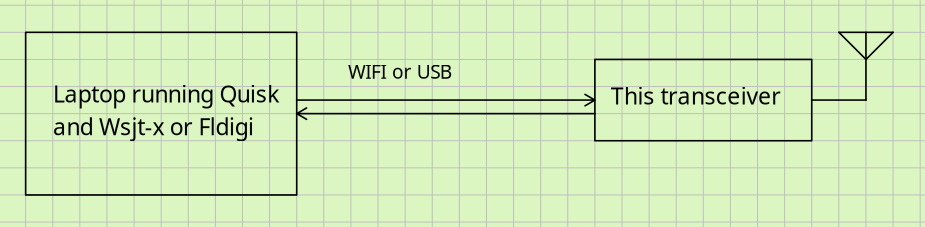

A clone of the Silicon Labs, Si5351a, the MS5351M is used as the local oscillator for the QSD down converter.  The resultant audio frequency data is sent to the PC where Quisk demodulates it and sends it on to WSJT-X or Fldigi for decoding.  The MS5351M's third oscillator is used to generate the digital signals on transmit.  These signals are amplified by a class E circuit for the 20-meter band.  Throughout the unit, there are features that provide stepping stones toward the final goal.  For example, an output is provided to allow the sound data to be sent to the PC where a sound card on the PC converts the sound signal to digital samples.  A Raspberry Pi Pico or Pico W is used on the SDR to control the MS5351M local oscillator and exciter, sample the receiver audio data using a PCM1808 ADC, and send the sampled data to the PC for processing.  It also receives transmit data from the PC to allow transmission of the digital signals desired.

The Kicad project SDR-TRX contains the hardware documentation, including the schematic diagram and the printed circuit board.  The software is still in development.

##  Transmitter 
The MS5351M, a Si5351a clone, generates a digitally transmitted signal (and the harmonics you expect) on its third output.  It is used to drive a set of CMOS inverters that in turn drive a MOSFET class E amplifier for 20 meters. 

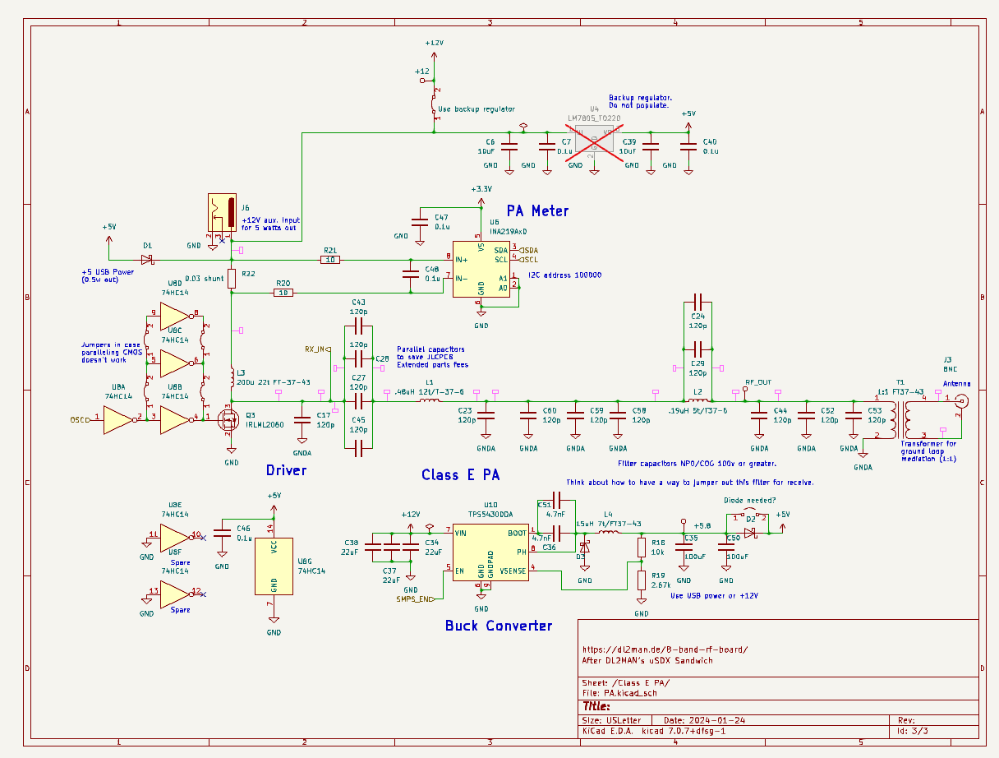

### Class E Amplifier
The design started with the DL2MAN sandwich Class E amplifier for 20 meters.  LTspice was employed to try and minimize the number of values of Extended Parts capacitors needed from JLCPCB while still maintaining a decent efficiency, power output, and harmonic attenuation.  The value of the capacitor that seemed to be best was a 120 pF 100V 1% COG multilayer monolithic capacitor.  We paralleled a bunch to make the amplifier we ended up with.  It was chosen first for harmonic suppression, second for power output, and lastly for efficiency, with the constraint of using only one value of capacitor.  The simulation has about 50 dB of harmonic attenuation, about a watt of output, and an efficiency of 75%.  See the simulation below which is called Class E.asc in the SDR 2023 Docs.

This simulation shows the efficiency and output power.

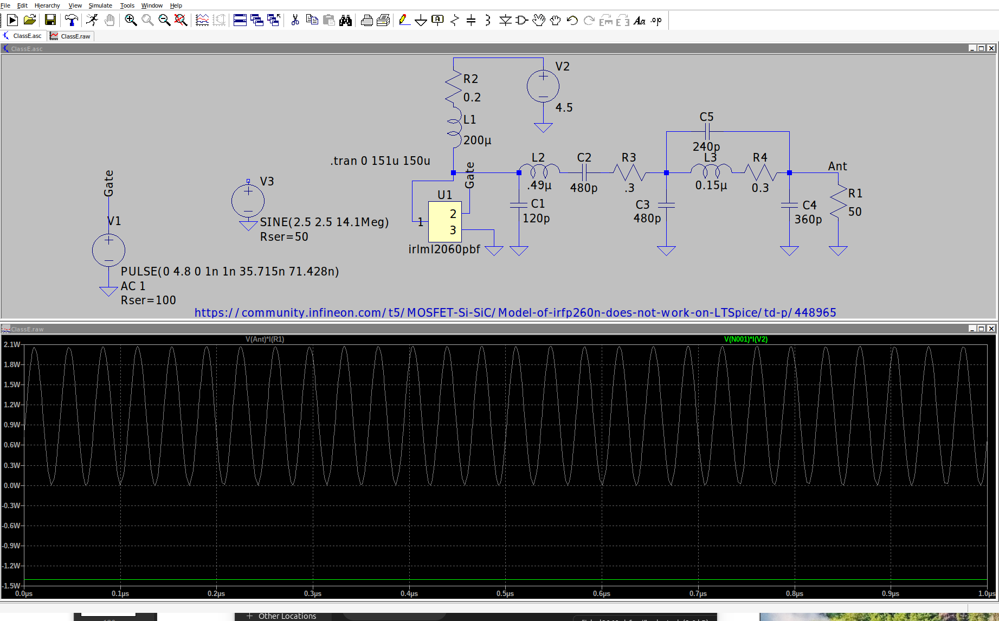

This is the FFT of the antenna voltage.
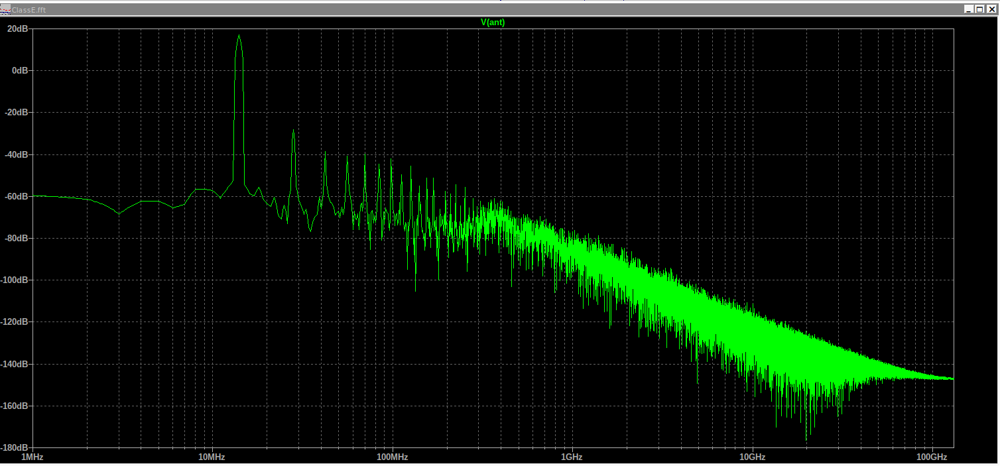

There is an I2C voltage and current monitor, the INA219A, that should allow measuring the DC power used by the class E amplifier so LTspice simulations can be verified for accuracy easily.


## Receiver
The receiver used was the [QSD Tayloe-type](https://www.norcalqrp.org/files/Tayloe_mixer_x3a.pdf) design using both inverting and inverting inputs.  The inverting input has a lower input impedance and so is more of a current amplifier.  The non-inverting amplifier has a high input impedance, and so acts as a voltage amplifier.  The low-frequency gain of the inverting amplifier is $\frac{-R_f}{R_i}$ and the non-inverting amplifier has a gain of $ 1 + \frac{R_f}{R_i}$ so the CMRR is  not as good as a fully differential amplifier, but we are just trying to amplify the signal not null out any common mode signal.  We need to keep the DC to $\frac {4.5V}{2}$ and the $1$ term perfectly does this for us for the common mode DC voltage.  There is a gain for the mixer of $1/4$ because the state space average of the switched voltage at the output of the mixer is a quarter of the input voltage.  The gain is initially set to about 20 between the antenna and I or Q.  These signals go into the soundcard or the onboard ADC, a PCM1808.

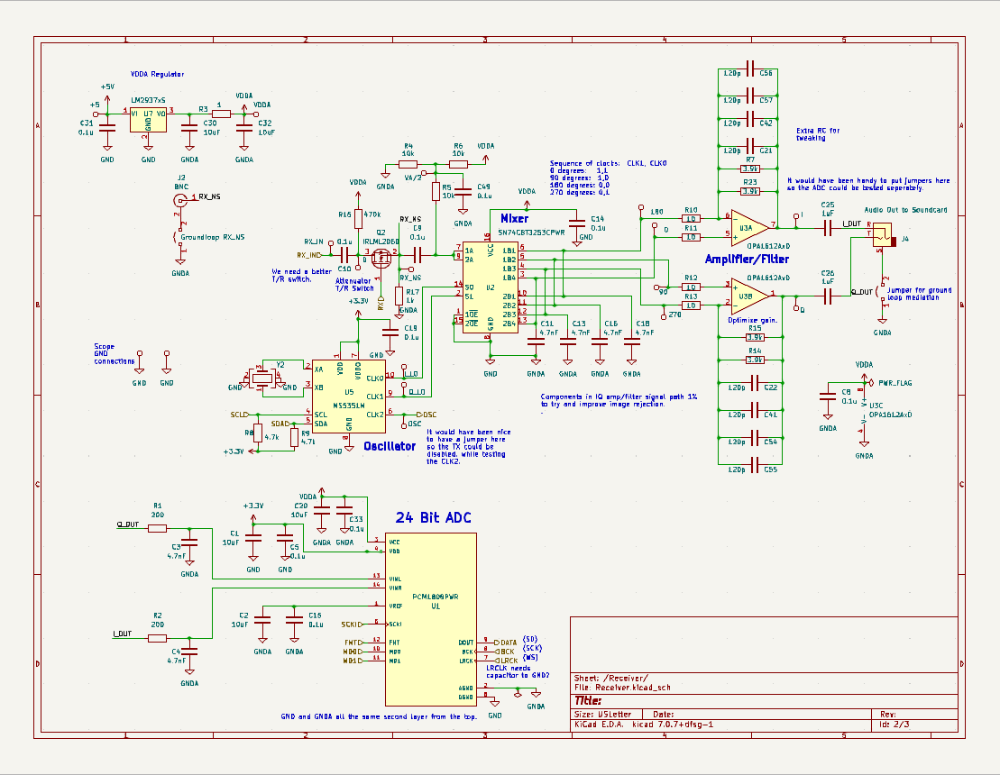


The MS5351M generates in-phase and quadrature signals for the SN74CBT3253 four-to-one analog switch mixer.

The sampling capacitors provide a low pass filter for the signal, and the cutoff frequency is $1/(2\pi R_f 4 C)$.  The factor of four comes about because the sampling capacitors only get charged a quarter of the time, or equivalently, there are four of them to charge.  The resistance, $R_i$, is the antenna impedance plus the 10 ohms on the inverting input.  The feedback capacitors, $C_f$ add another pole of low pass filter to the signal.  The cutoff frequency of these filters is $1/(2\pi R_f C_f)$.

There are two antenna inputs (BNC connectors), one on a transmit/receive switch that uses the Class E filter to try and filter the received signal, and another one that bypasses the filter that can be used when we want to listen to more than just 20 meters.  It can also suffice to do real-world testing to see which is preferable.

An LDO linear regulator powered by the USB 5 volts or the external 12-volt power supply provides a 4.5 volt low noise power for the analog parts in the receiver.  When the 12-volt input is used the USB power supply is disconnected by some Schottky diodes and two possible regulators drop the voltage to about 5.8 volts to run the rest of the radio except the class E PA stage.  These are selected by an I/O line from the processor or by not populating the undesired supply.  The two options are an SMPS buck regulator or a 7805 linear regulator that is not as efficient but should not produce switching noise. We will experiment to see which we like and choose that one.

There are several ground loop suppression strategies available.  The filtered antenna uses a transformer.  In other places, a jumper is provided to allow a single ground connection through the power supply.  


## Control Circuitry
The control of the SDR comes from the operator via the PC interface software (Quisk, for example), which sends the data to the SDR via USB UART or via WIFI.  The MCU that we chose is the Raspberry Pi Pico or Pico W if WIFI is desired.  It controls the MS5351M programmable oscillator using I2C and uses the INA219 to measure the current and voltage of the power amplifier.  It also reads the ADC via I2S and transfers that data to the PC where Quisk or a similar program demodulates it.  The only software running at this time is a rudimentary I2S control for the ADC, and software to set the oscillator frequency using Quisk.  Sending the ADC data back to the PC and ensuring the sample rate is correct (probably by dropping a few samples every so often) still needs to be programmed and the software to tell the Pico what the MS5351M needs to do for transmitting all need to be programmed.  Transferring ADC data from the PCM1808 to the computer requires a faster programming language that MicroPython unfortunately, so we are using C++ and the Earl E. Philhower, (Arduido-Pico)[https://arduino-pico.readthedocs.io/en/latest/index.html] development library.  The easiest way to get started is to use the Arduino IDE, but VScode with Github Copilot there are a lot more features.  You have to [read how to make the Arduino-Pico](https://arduino-pico.readthedocs.io/en/latest/platformio.html) code work with VScode.

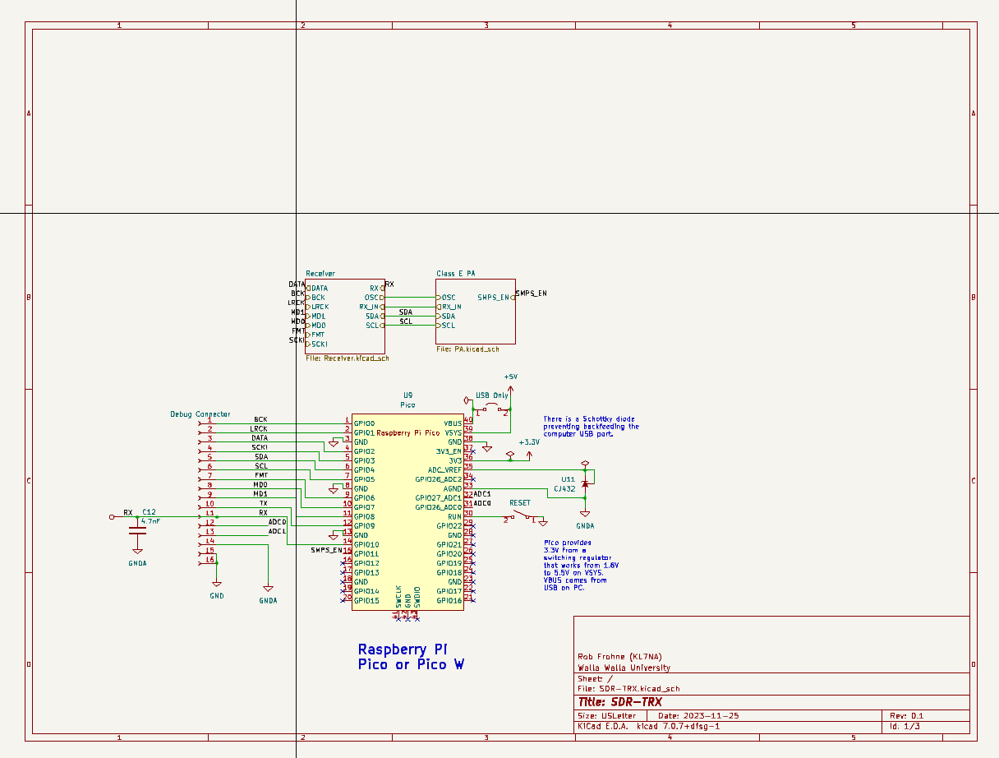



### PCB
The PCB has test points and uses components I found still available on JLCPCB.  That accounts for why a mix or 0603 and 0805 components, and why there are a lot of 120pF and 4.7nF caps in parallel.
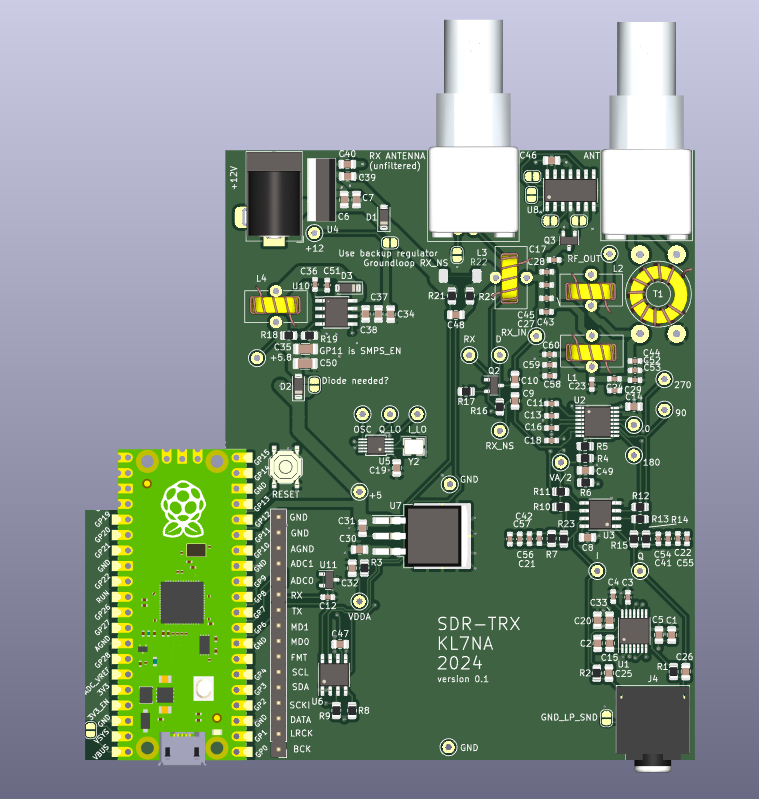
The cutout is for the WIFI antenna if a Pico W is used.

# Onboard ADC Development
The board has a TI [PCM1808 24 bit ADC (U1)](https://www.ti.com/lit/ds/symliHznk/pcm1808.pdf?ts=1709329520780&ref_url=https%253A%252F%252Fwww.google.com%252F).  Developing the software is a work in progress.  At this point, we are able to use the [Arduino-Pico development tools](https://arduino-pico.readthedocs.io/en/latest/serial.html) to read the ADC and send the data using ASCII over the USB ACM CDC model UART, provided we sample at 16 kHz or lower.  This is about 2.56 Mbit/s.  If we send the data in a binary way and only use 16 bits per sample for each channel, at 96 kHz we will need 3.072 Mbit/s. So it might be possible.  I added four spaces to the text per line and that is 3.072 Mbit/s, so it should work if we can figure out how to send control data too.  I think this may be possible because we will need t o throw out some data to match the sample rate correctly.  At 16 kHz target sample rate, the actual sample rate is 16.015 kHz, so we would get 15 samples every second to use for control, and at 96 kHz, that is 90 control frames per second.  We should be able to send 32 bits at 48 kHz if that appears better.



#### Possible Ways of Encoding the Control Signals
We could reserve a binary signal that indicated to the receiving computer that it was a control signal.  We would have to check outgoing signals to make sure that this signal was removed from the bitstream if it ever occurs.  We could replace it with a number very close to the signal binary value.  For example if we reserve 0x0000 as the control signal flag, we could send 0x0001 instead if it occurred, and it wouldn't hurt much at all.  The following is the code I have that reads the I2S data and sends it over the UART to a PC.

###  Board Bring-up Plan

* Bring up the receiver  
    * Build the rest of the board
    * Make sure it isn't drawing too much current  (It draws about 20 mA on receive.)
    * Test the MS5351 with a simple Pico program  (It works fine.)
    * Test with a signal generator (It has sub-microvolt sensitivity, but image rejection is poor.)
    * Test with code that allows tuning from Quisk using audio out via the 3.5 mm jack and RX_NS input  (Cadyn's code works fine.)
    * With Signal Generator
        * Measure image rejection (Poor results.
            * Measure the balance of the sound card using Gnuradio with both inputs connected together.  Look at the sum and difference and compute the CMRR.
            * Make I = Q and measure the whole ADC and RX.  I must be channel 1 and Q must be 0 or the spectrum is inverted.
        * Sensitivity
      * Check how the ANTENNA input works on receive  (With antenna and jumpers on sound and RX_IN, the noise is bad (-50 dbm). See the section below on testing using the signal generator.
#### To-do list 3/8/2024
* Wind the main antenna transformer and see if that fixes the ground loop problems.
* Figure out how to send UDP packets from the Pico W to the PC.  This will allow you to run without USB connection, which eliminates a lot of birdies, and makes the MDS better.
    * I was having issues connecting at home.
    *  Search some more to see what bit rate you can expect for WIFI UDP. (Found that 96 kHz works even with ASCII data transfer.)
* Maybe try harder on the M-Audio card.
    * Maybe try a Delta 44 card or something in a desktop.
    * Maybe try the USB sound card that looks like a vacuum tube.
    * Solder in the 7805 and the other BNC connector.
* Examine how you are coupling the antenna to the receiver.
    * Do you want to use a transformer on RX_IN?
    * Is the 20-meter TX filter a problem for receiving on other bands?
    * Is the transformer a problem for the TX filter?
 * Figure out why the SDR-TRX ADC is putting out zeros, when the module works.

## Testing Notes
#### Noise testing using the signal generator:
* Initially, the noise was at -50 dbm.  Soldering both the antenna and sound ground loop jumpers reduced the noise to -80 dbm with a few weak birdies.  Disconnecting the Pico from USB with no power gets the noise down to -105 dbm without power.  Connecting to a lab power supply without USB it is -85 dbm with much fewer birdies.  With a 0.1uV there is still about a 10 dB S/N using a lab power supply and no USB connected. Connecting the USB gives more birdies and then running on USB power has a bit more, but the signal is still 20 dB prominent at 1 uV.

#### Image Rejection
##### SD-AUD20101
The [Syba SD-AUD20101](https://www.sybausa.com/index.php?route=product/product&product_id=694) sound cards I have been using are not balanced.  The blue line in this screenshot from a gnuradio test is the left channel minus the right channel and they are both connected to the same signal generator.  It is apparent this is not going to give good image rejection.  Here are photo of the sound cards I have been using:
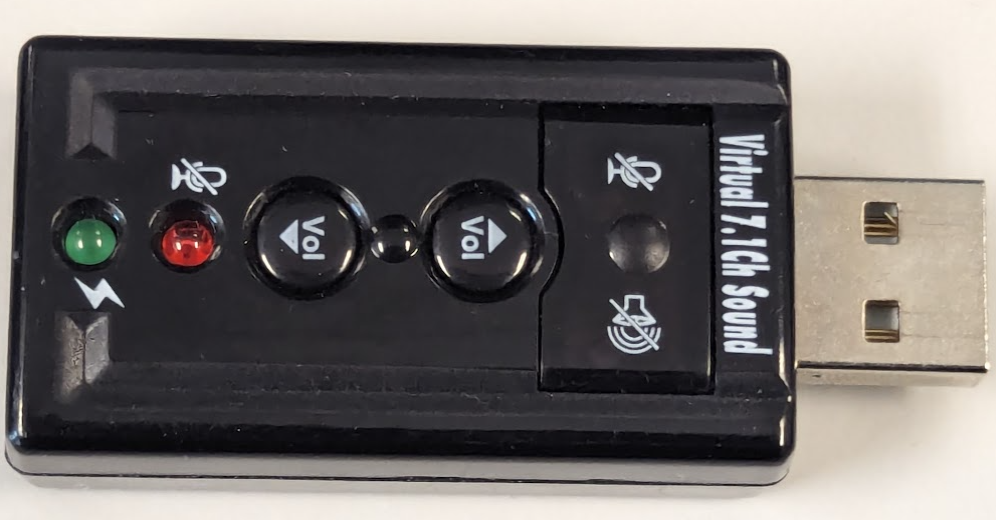
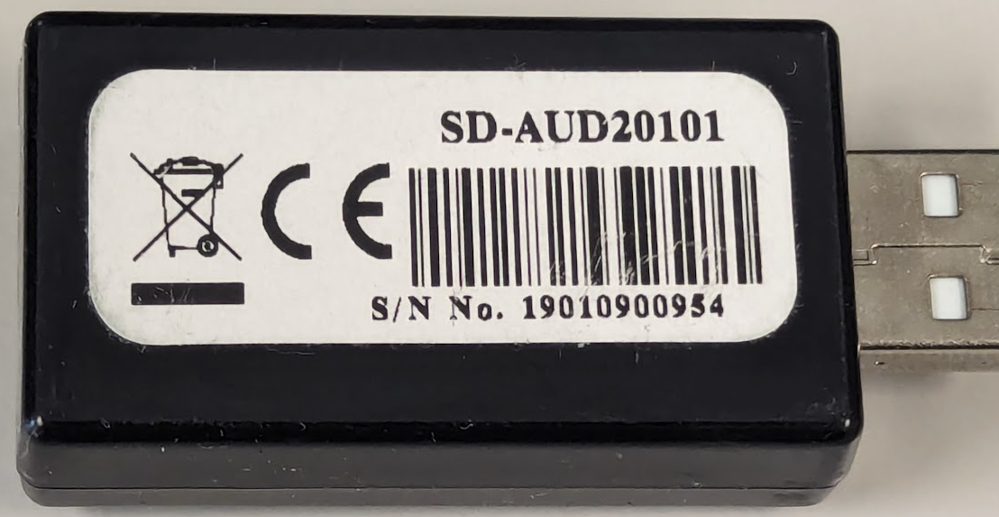
The following plot shows how bad this sound card is.  Interestingly the difference varies up and down, but it is close to what you see her most of the time.  The best image rejjection we could hope to get with a "perfect" balance on our hardware would be $20 log_{10}(.85/.03) = 31$ db, which is what I have been getting with it using several designs.
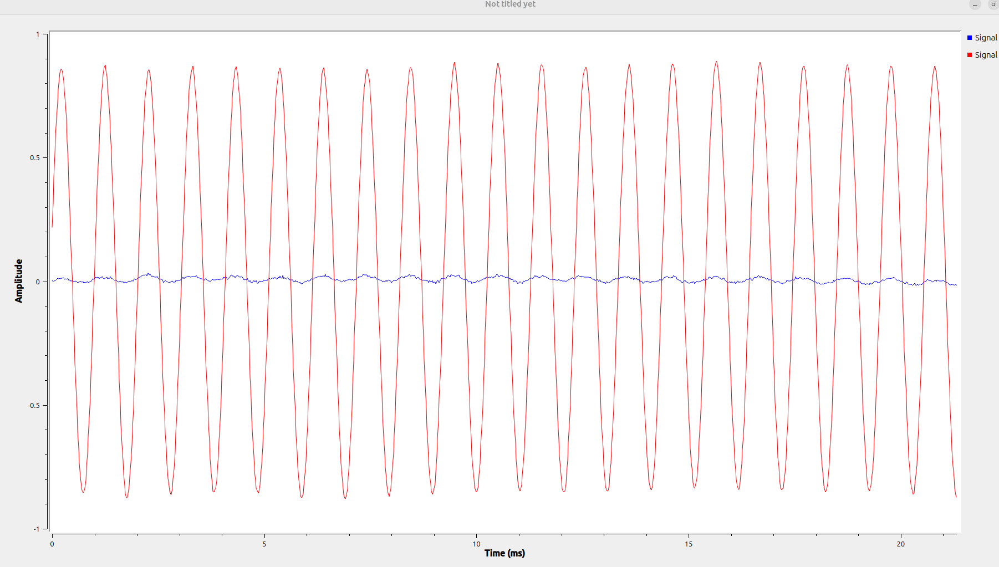
The gnuradio file I ran to get this is this and is located in SDR 2023 Docs.  
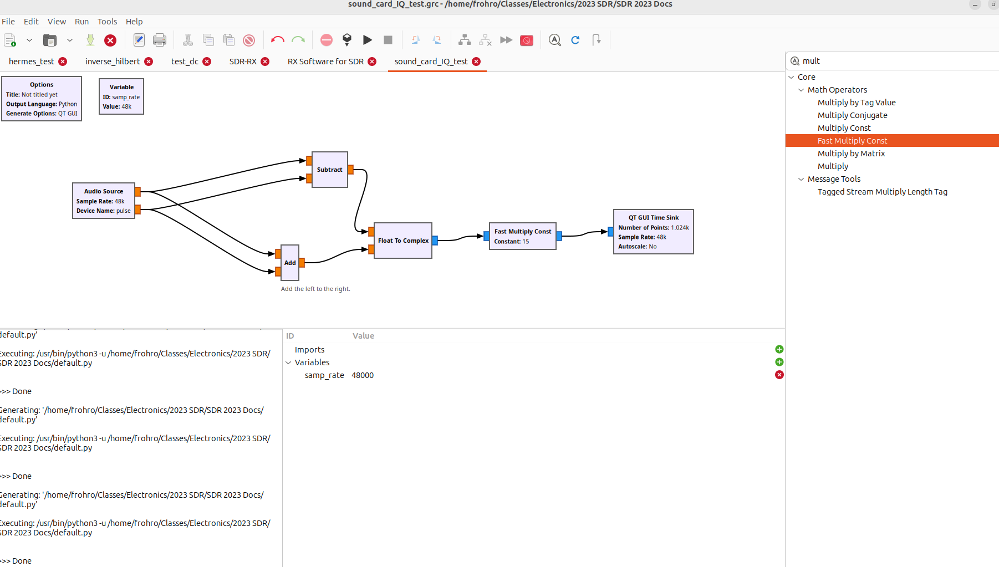
##### PCM1808
I did a similar test with the PCM1808, but I needed to multiply the difference by 1000 to get a good measurement.  I got this:
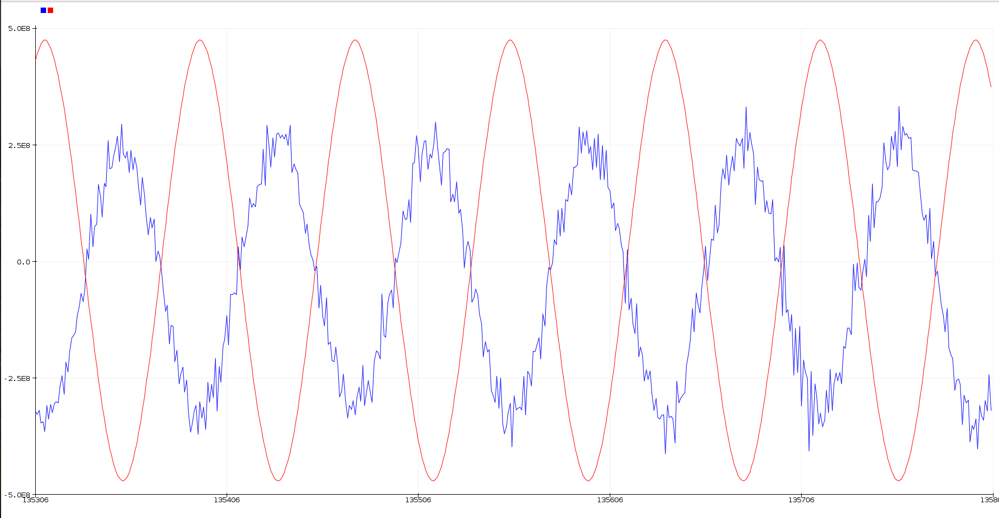
The code for this is below:


This should give us an image rejection if our other components were perfect of $20 log_{10}(1000*9/6) = 63$ dB.


#### The VIA Technologies USB codec time response
The Via soundcard does not give left and right the same delay phase as a function of frequency.  at low frequencies it looks about 90 degrees out of phase when it should be, but at 12 KHz it is about 180 degrees out of phase.  This probably means there is a delay between right and left channels.  The delay on the scope is still about 90 degrees back on the board I and Q test points. It looks better with one sample delay.

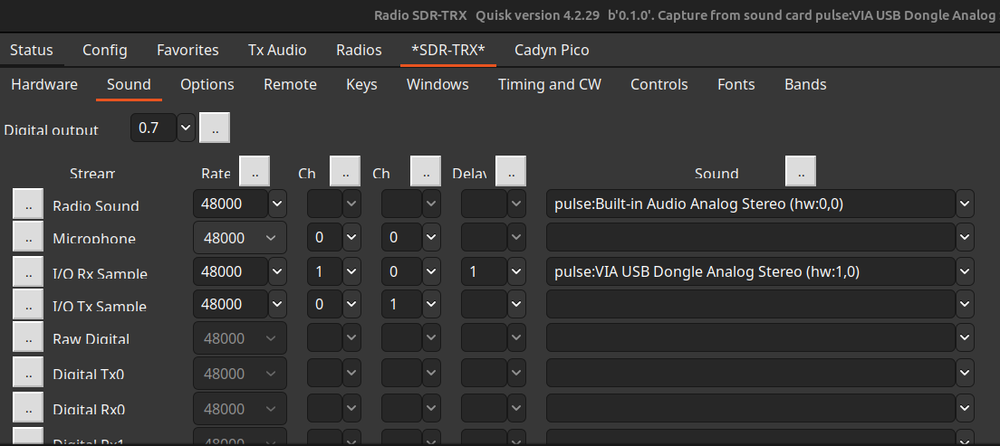

#### Testing the M-Audio Audiophile USB
I could not get audio input to work with this board on Ubuntu 23.10.

#### Calibration for Image Rejection
We should be able to set the I and Q local oscillators to the same phase (and frequency) and measure the transfer function for each.  Then we could predistort the I and Q signals appropriately to get "perfect" balance.

#### Testing with the antenna at School on FT8 for Sabbath and part of Sunday 3/16 and 17

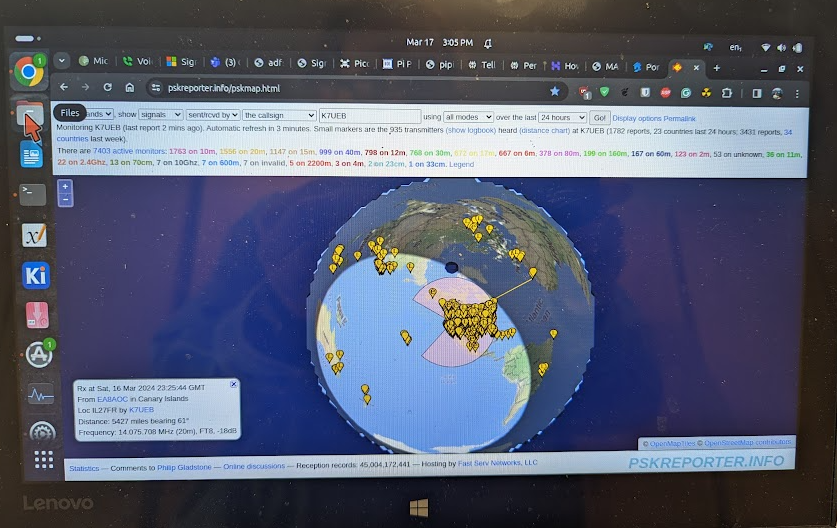

This was done with the VIA sound card and using USB control with the E4300 Dell laptop and the vertical on Chan Shun Pavillion.

Here is a [video](https://photos.app.goo.gl/ZDZeubySqx67qGxW9).



### Software Notes:
We are using the OpenRadio protocol for control and since the noise is so much better using no USB cable and the radio is more flexible, we are planning to use UDP to transfer the data to Quisk.  Here is a screenshot of the VER and FREQ commands from the Red SDR.  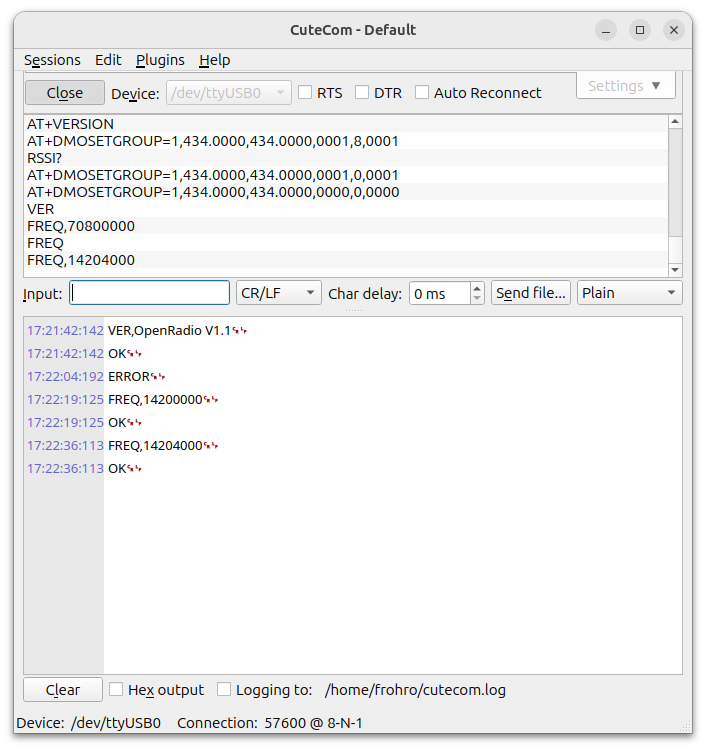  You can see that every command needs to be followed by a /r/n.  Then an OK/r/n is sent.

### Pico Software Mysterious Behavior
* If I do not start the sendData initially, the UDP data stream does not work properly.  The LRCLK is messed up. The PCM1808 goes to sending all zeros or other constant data when this happens. Putting delay(1000) after i2s.begin() in setup and loop allows the PCM1808 to work (have the correct clocks if they are touched), but the data command stream does not go. Even when LRCLK looks okay, the data stream doesn't work if we don't send it immediately.
* Getting rid of the Serial.println() in the UDP command stream still does not go. When I try and send data over UDP, it messes up LRCLK.
* Sometimes VER does not return the version, only "OK".  This seems to happen only on the first transmission.
* Getting rid of the Serial.println() and, always sending data and having the scope probe in LRCLK seems to work, except that VER only gets "OK".  This happens on both boards I built so far, and requires a capacitor to ground to fix the issue.

There appear to be these issues.
* The other seems to be a software issue where the data stream needs to start immediately or LRCLK and/or the UDP data stream do not work.
    * The fact that VER does not return the version the first time (sometimes).

## Status 3/14/2023
* Software seems to work to send/receive commands via UDP over WIFI from Quisk.
    * We added control over the UART again this afternoon.  The goal was to make that work with the quisk_hardware_file for the Pico.  The Quisk code needs to be worked over to work with this.  Using a terminal program seems to work.
    * It worked with the antenna on 20 meters this afternoon using UDP with Quisk.  Putting the analog power supply in parallel with the USB one helped a lot, and removing the USB cable made it even better.
    * We added a capacitor from LRCLK to GND and now data seems to come regularly.
### To Do for Receive Software
* The data over UDP needs to be added to Quisk.  It already seems to work for the PICO.
* Widgets probably need to be customized.
* We need a way to find out the IP address of a radio from Quisk.  Perhaps something like a broadcast out on a new discovery port.  
    * This needs some kind of protocol like the HPSDR uses.  Maybe use the same thing.
* Clean up the Pico code. 
        

### Debugging Tools
* Netcat (nc) is useful.
    * \$ nc -u -l 12345 (This simulates a listener for any data coming in on port 12345.  It is useful to listen for data coming from the Pico on the data port.)
    * \$ nc -u 192.168.1.101 12346 (If the IP of the Pico is 192.168.1.101, it will pass whatever you type on the next lines to the Pico on port 12346, so you can type things like VER, and hopefully the Pico will respond in the nc window, below what you typed, just like it would over the UART.)
    * Netcat can also be useful to make sure the router passes data on the UDP port you wish to use.  Routers often block ports for security, so they need to be tested and their settings need to be modified to allow the UDP traffic to pass.
    * The first time you program a Pico, you need to use the Arduino IDE.  VScode cannot deal with a UF2 file properly (at least for me).
    * interceptty is also useful as a monitor of communication.  I have used it to monitor serial communication both ways with this command: \$interceptty /dev/ttyACM0 ~/ttydummy
        * You need to set the Linux program to use /home/frohro/ttydummy.  ttydummy is created where you run interceptty.
        * The interceptty program can also be used for monitoring sockets, but I haven't tried it yet for that.



## Testing Unit 2
We built up a second unit, connecting the transmit antenna and adding the inductors and transformer for the transmitter.  Here are some preliminary tests.  I think this may be the first time an FT-8 I made has been received.  
* It has the same no data out until LRCLK is messed with kind of problem.
* The receive sensitivity is not as good as the RX_NS input.
    * The 320 pF of the filter output is $31 \Omega$.  This loads the antenna $50 \Omega$ source considerably and so needs more work.  We need to test the RX_NS on this unit too, with the FET in TX position, but no oscillator to make sure we understand the problem.
* There is some kind of noise that is apparent when using the VIA USB sound cards.  Connecting a 5V linear supply to VSYS helps.  I tried soldering the ground loop jumper on the audio jack and it did not help. I saw a similar thing on unit 1, but I thought it was ground loop noise.  It appeared to go away approximately when I soldered ground loop jumpers on that unit.  The noise is coming from the board because disconnecting the audio cable stops the noise.
    * Unplugging the USB with the external 5V linear supply plugged in did not seem to help. There were some strong birdies I noticed this time.
* It puts out between .25 and .36 watts on transmit.  This was tested with a simple Arduino program.  I'm not sure the regular code works.
    * I was expecting about a watt out from simulation, and the already wound RF choke I put in was getting a little warm, so I replaced it with the FT-43 21 turn toroid, and the power was up to 1.2 watts.  So being lazy on the toroid was not a good idea.
* tx_enable() works for CW keying.
* After fixing some bugs, TX and RX, TX_FREQ and RX_FREQ work correctly.

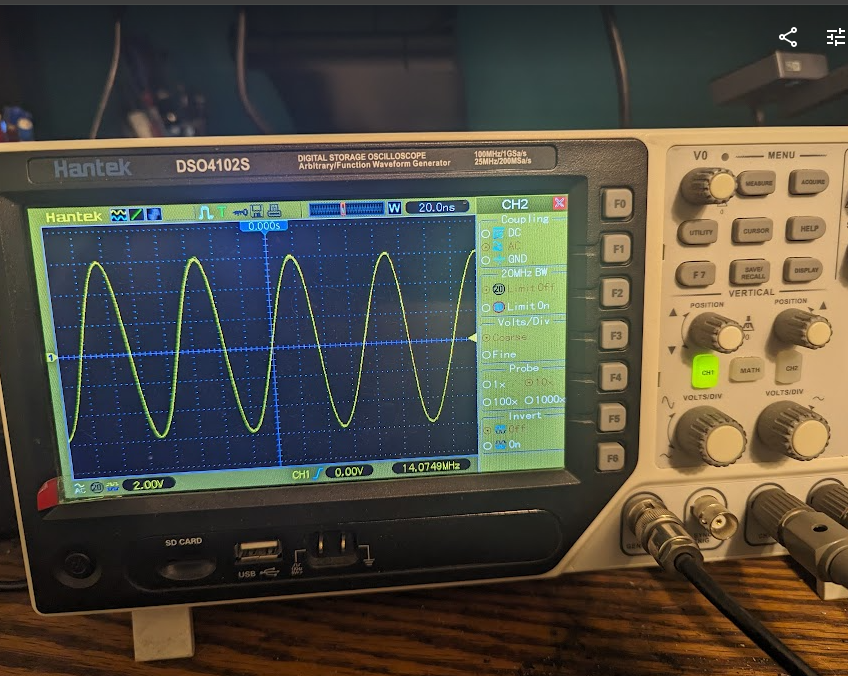
  
* CAL_FACTOR seems to have some issues.  It does not seem to work on both units.
* Harmonics seem okay (about 40 dB down).  It is hard to measure because it jumps around a bit, and I don't think I can safely put the output directly into the spectrum analyzer.

  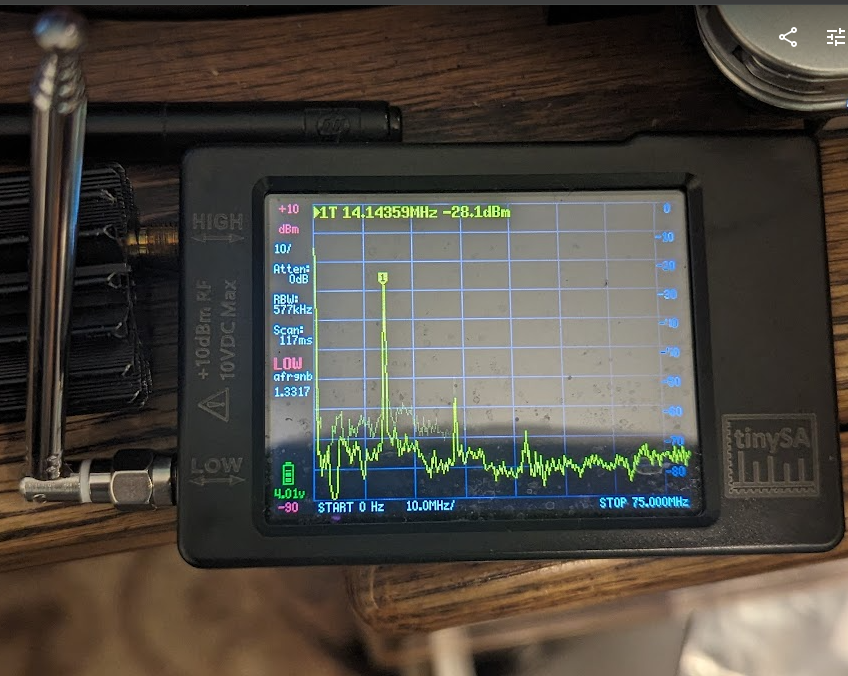

* I see funny things on the I and Q test points.  The magnitudes of the two waves are not equal at all.  I'm also not seeing great image rejection with this unit.
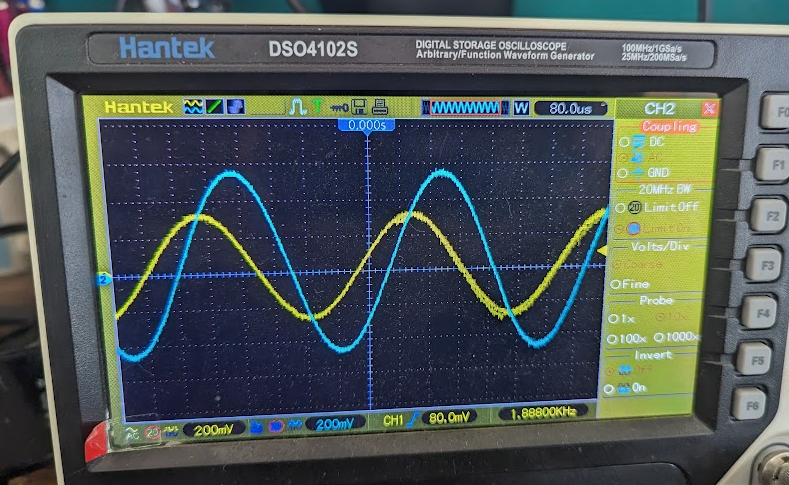

4/2/24  This seems to have disappeared.  The I and Q look pretty good.

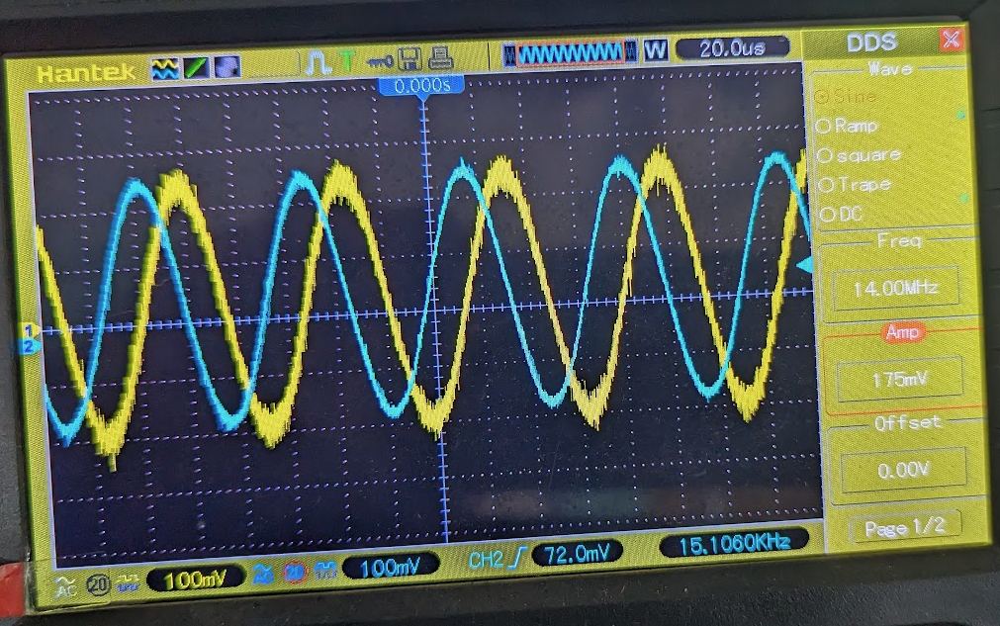

The inputs to the op amps look similar.  The image rejection varies from 15 dB to 30 dB except really near $f_s / 2$ where it goes to - 30 dB.
  
    * The signals at 0, 90, 180, and 270 also do not match with the simulation.
      
      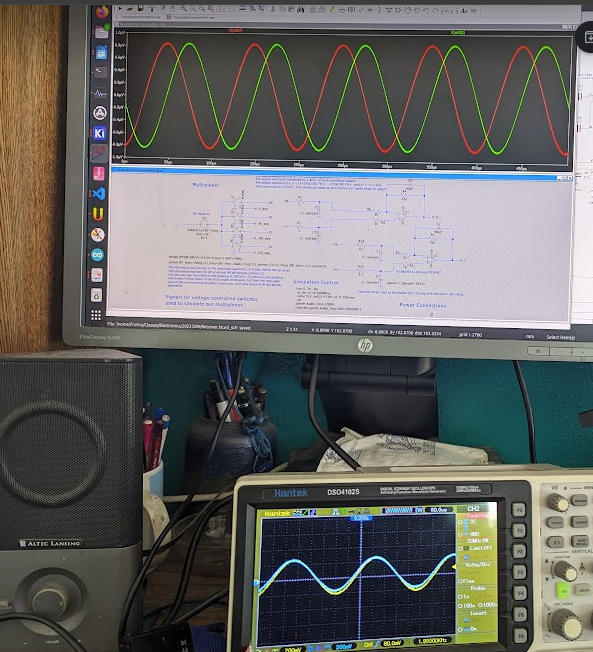

      We need to test Unit 1 and see what it shows.
* It appears I messed up the UDP data stream since I checked it because with this unit I am not getting a sinewave where I should be.
* I made a script that plots the first NUM points that are recorded in sound_data.csv and it does not give sinusoidal data like I got before with the PCM1808 dev board.
* The efficiency is 43% overall using the USB meter.  Being lazy on the RF choke is causing problems.  It is getting warm. (This was before replacing the RF choke.
* The efficiency now is $1.2/(5.16*0.311) = 0.745$ or 75% including RX current.  If we don't include that it is $1.2/(5.16*(.311-0.06)) = .926$ or 92.6%.  (This might be generous.  It now looks like there is only 1 watt out.) Later testing with transceiver_control.py it only drew 223 mA and was putting out 1.1 to 1.2 watts. This gives efficiencies between 90 and 100 percent.
* Receiver current seems to be about 65 mA.

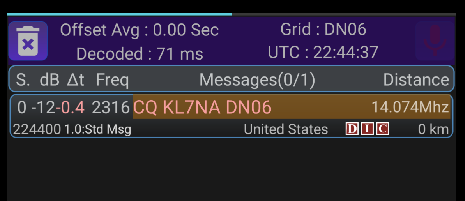
  
* I think I have the transceiver_control.py, ft4.py and the ft8.py working working with wsjt_transceiver.ino.  The above screenshot was from my phone using FT8CN and the above programs running on Linux and the Pico W.

* The T/R switch we are using has about 10 dBm when transmitting with 1.2 watts.

### Comparing Results on Unit 1
* The IQ balance appears better.  The photo below shows a test on unit 1, where I am putting in a signal at the antenna from the scope/function generator and looking at the I and Q outputs.  I'm not sure what is happening here, because these were both built by JLCPCB using 1% components.  This should not be happening.

 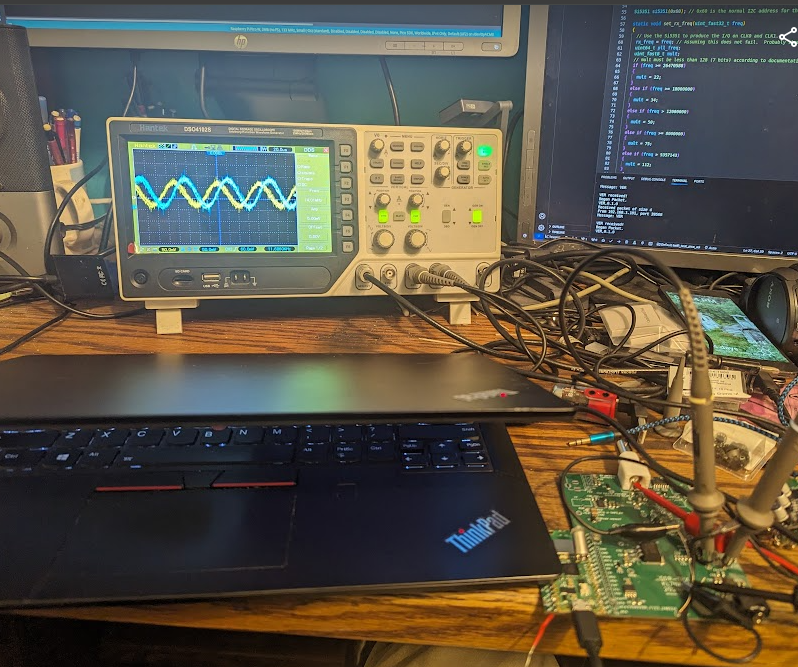

* Now, no unit is getting data through at 96 kHz.  I am doubting my previous testing whose conclusion was the WIFI UDP was working at 96 kHz with ASCII encoding. Now all I can get is 16 kHz.

### Software Architecture 
I think it would be good to make an Arduino Library and move most of the heavy lifting there.  These are ideas that need consideration.
 * The commands presently follow the lead of [Openradio](https://github.com/darksidelemm/open_radio_miniconf_2015).  These commands use a lot of letters to send data back and forth on the serial port.  This might not have been bad when we were not sending audio data too, but now it slows things down.  I am kind of leaning toward using only one ASCII byte per command like [wsjt-transceiver](https://github.com/agustinmartino/wsjt_transceiver) uses, or maybe some other more stream-lined protocol.
 * At this point, we have programs that demonstrate the receiver working with audio input, the transmitter working, but not fully integrated for control signals.  Quisk will need to play the roll of transceiver_control.py, control of the receiver and it also needs to be able to receive audio data over the USB UART, or we need to use UDP and separate things out by ports.

## To Do 3/26/2024
 * Test the transmmitter at high power.
 * Test the switching power supply for noise and functionality.
 * Test the 7805 regulator.
 * Test the transmitter at +12V.
 * Integrate Quisk
 * Refactor the Arduino code into a library.
 * Decide on a control protocol.
     * The wsjt_transceiver_server works with WSJTX over UDP, so we don't have to use the serial code to use USB.  
 * Get the audio data going at 16 kHz with Quisk over USB and UDP
     * with ASCII.
     * with binary audio data.
 * Test interceptty with UDP sockets.
 * ~~Write a widget plugin for Quisk so we can replace transceiver_control.py.~~ This no longer needs to be done, as wsjt_transceiver_server works with WSJT-X on UDP and the USB serial port.
 * Write code to interface with WSJTX directly to the Pico W using WIFI.  The code for wsjt_transceiver_server should help with this.
 * ~~Gather it all together, and put it on github.~~
   

### Update 4/8/2024
* I now have UDP code working for control with Quisk and WSJT-X working for the FT8 mode.  The FT4 mode has a bug where it only transmits at 7 and 22 seconds after the minute, but I think that bug was with the original FT4 code I started from, [(WSJT Transceiver Interface)](https://github.com/agustinmartino/wsjtx_transceiver_interface).
* N2ADR confirmed that the minimum sample rate Quisk will operate at is 48 ksps.

### 4/17-19/2024
I am attempting to use Core0 to send the data from the I2S which is gathered using Core1.  That is the Multicore_Test_UDP_Data_Stream.ino file.  I am using a circular queue of 1468 byte UDP buffers to try and accomplish this.  I decided I prefer this to a ping pong buffer after realizing that Core0 has brief pauses due to USB interrupts and probably WIFI ones too.  I am packing UDP packets with 1468 bytes per packet, which has 32 bit integers (4 bytes for each I and 4 for Q and one uint32_t for the packet_number, so I can sort out of order packets at the Linux host).  I plan to cut this to 24 bits later, but for debugging it is easier to read the data in Wireshark this way.  I can only use 48 kHz sampling at best this way.  I calculate that 96 kHz is possible if I use 3 bytes per I or Q sample.  I discovered to my shagrin that you cannot idle Core0 without dire consequences.  I showed that [here](https://github.com/earlephilhower/arduino-pico/discussions/2107).  I went to using pico/mutex and then had problems with the udp.write() hanging, so I used a temporary buffer and mcpy() to gete around that.  I still need to have a delay(1) that is unexplained, but it appears Multicore_UDP_Data_stream.ino is working with 32 bit packing.  Now SDR-TRX.cpp and the PCM1808_I2S_UDP.cpp and header file seem to work for TX and RX commands and send sound data back on port 12345 at 96 Ks/s using int32_t for each sample,left first and then right.  The first uint32_t in the packet is the packet number and can be used to keep the order right.

### 4/22/2024
#### Missed Packets at 48 ks/s and 96 ks/s
We made test_UDP_file.py and it shows that there are some missed packets at 96 ks/s.  At 48 ks/s it seems to work fine.  This was with 32 bit encoding.  The test_UDP_file.py produces a 16 bit .wav file so you can listen to the data.  I made 24 and 32 bit versions. The file  plot_wav.py plots the points from the .wav file.  With 32 bit 48ks/s data, I have 388 kB/s.  With 96ks/s I have 770 kB/s using 32 bits.  This lines up with the bit rate I calculate I will have.  With 24 bit encoding the Ubuntu System Monitor gives me 3/4 of the 32 bit number which is correct.  The number of missed packets with 24 bit encoding at 96 kHz is about 0.5%, or one every 0.3 seconds.  I tried using less samples per packet and it got worse.  At 48 ks/s, 24 bit encoding, I get 0.18% missed packets or about 1 every 3 seconds.  This means our 24 but python test_UDP_file_24bit.py is causing packet loss, because the 32 bit version has no packet loss at all. (I retested to make sure.)